## Import libraries

In [ ]:
!pip install pyclustering

import pandas as pd
import seaborn as sn
import matplotlib.pyplot as plt
from sklearn.cluster import SpectralClustering, KMeans, DBSCAN
from sklearn.decomposition import PCA
from sklearn import mixture
from pyclustering.cluster.clarans import clarans
from itertools import product

from pyclustering.cluster.kmeans import kmeans, kmeans_visualizer
from pyclustering.cluster.center_initializer import kmeans_plusplus_initializer
from pyclustering.samples.definitions import FCPS_SAMPLES
from pyclustering.utils import read_sample
from pyclustering.utils.metric import distance_metric, type_metric

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
RANDOM_STATE = 42

# function that read csv
def read_csv(path):
    csv = pd.read_csv(path)

    # drop the row with missing values
    csv = csv.dropna()

    correlation_matrix(csv)

    # divide the data.
    # X is the data without the 'median_house_value' column
    # y is the 'median_house_value' column
    X = csv.drop('median_house_value', axis=1)
    y = csv['median_house_value']

    return X, y

In [ ]:
def correlation_matrix(df):
    corr = df.corr()
    plt.figure(figsize=(12, 10))
    sn.heatmap(corr, cmap='RdBu_r', annot=True, linewidths=0.2)
    plt.show()

## Part 1: Define helper functions for preprocessing the data
Helper 
1. data_scaler(data, scale_type)
   : data scaler function scale the data according to the scale_type
   : supported scale_type: 'standard', 'minmax', 'robust'
   
2. data_encoder(categ_att, encoder_type)
    : data encoder function encode the categorical data according to the encoder_type
    : supported encoder_type: 'onehot', 'label'
    
3. preprocess(data, scaler_type, encoder_type)
    : preprocess function preprocess the data according to the scaler_type and encoder_type
    : call data_scaler and data_encoder functions
    : return the preprocessed data

In [ ]:
def data_scaler(data, scaler_type):
    from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler
    if scaler_type == 'standard':
        scaler = StandardScaler()

    elif scaler_type == 'minmax':
        scaler = MinMaxScaler()

    elif scaler_type == 'robust':
        scaler = RobustScaler()

    else:
        raise ValueError('scaler_type must be standard, minmax or robust')

    return scaler.fit_transform(data)


def data_encoder(categ_att, encoder_type):
    from sklearn.preprocessing import OneHotEncoder, LabelEncoder, OrdinalEncoder
    if encoder_type == 'oh':
        encoder = OneHotEncoder()
        return pd.get_dummies(categ_att)

    elif encoder_type == 'lb':
        encoder = LabelEncoder()

    else:
        raise ValueError('encoder error')

    return pd.DataFrame(encoder.fit_transform(categ_att), columns=['ocean_proximity'])


def preprocess(data, scaler_type='standard', encoder_type='lb'):
    encoded_feature = data_encoder(data['ocean_proximity'], encoder_type=encoder_type)  # 함수 불러서 인코딩, 그 피처 하나 리턴
    data1 = data.drop(labels='ocean_proximity', axis=1)  # 기존 오션 드롭, inplace 안하고 data1에 저렇게 받아놓으면 함수 여러번 불려도 새롭게 떼어져 나감
    data1 = data_scaler(data1, scaler_type=scaler_type)  # 오션 나머지 스케일
    data1 = pd.DataFrame(data1)
    data1.columns = ['longitude', 'latitude', 'housing_median_age', 'total_rooms', 'total_bedrooms', 'population',
                     'households', 'median_income']
    data = pd.concat([data1, encoded_feature], axis=1)  # merge encoded feature and scaled data
    data = data.dropna()  # drop the row with missing values

    return data

"""
## Part 2: Define helper functions for PCA
Helper 
1. PCA function
    : reduce the dimension of the data to 2
    : return the reduced data
"""

In [ ]:

def _PCA(data):
    pca = PCA(n_components=2)  # 2차원으로 줄이기
    pdata = pca.fit_transform(data)
    pdata = pd.DataFrame(pdata)
    pdata.columns = ['P1', 'P2']

    return pdata

"""
## Part 3: Define helper functions for clustering
Helper
1. clurster function
    : cluster the data using the clustering algorithm
    : supported clustering algorithm: 'kmeans', 'spectral', 'dbscan', 'gmm', 'clarans'
    : return the trained clustering model
    
2. plot function
    : plot the clustered data
    : supported clustering algorithm: 'kmeans', 'spectral', 'dbscan', 'gmm', 'clarans'
    
"""

In [ ]:
def cluster(data, cluster_type, scaler, encoder, param_lst):
    if cluster_type == 'kmeans':
        n_k = param_lst[0]
        dist_met = param_lst[1]

        plist = data.values.tolist()
        
        initial_centers = kmeans_plusplus_initializer(plist, n_k).initialize()
        model = kmeans(plist, initial_centers, metric=dist_met)
        model.process()
        clusters = model.get_clusters()
        final_centers = model.get_centers()    

        return [model, clusters, final_centers, initial_centers]

    elif cluster_type == 'spectral':
        n_k = param_lst[0]
        model = SpectralClustering(n_clusters=n_k, random_state=RANDOM_STATE).fit(data)

    elif cluster_type == 'dbscan':
        eps = param_lst[0]
        min_samples = param_lst[1]
        model = DBSCAN(eps=eps, min_samples=min_samples).fit(data)

    elif cluster_type == 'gmm':
        n_k = param_lst[0]
        cov_type = param_lst[1]
        model = mixture.GaussianMixture(n_components=n_k, covariance_type=cov_type).fit(data)

    elif cluster_type == 'clarans':
        max_neighbor = param_lst[0]
        num_local = param_lst[1]
        model = clarans(data, num_local, max_neighbor, 4)

    else:
        raise ValueError('cluster_type must be kmeans, spectral, dbscan, gmm, or clarans')

    return model



def plot(model, data, c_type):
    # scatter plot
    plt.figure(figsize=(10, 10))

    if c_type == 'kmeans':
        plist = data.values.tolist()
        _, clusters, final_centers, initial_centers = model[0], model[1], model[2], model[3]

        kmeans_visualizer.show_clusters(plist, clusters, final_centers, initial_centers)

    elif c_type == 'spectral':
        plt.scatter(data['P1'], data['P2'], c=model.labels_, cmap='rainbow')
        plt.title('Spectral Clustering')
        plt.xlabel('P1')
        plt.ylabel('P2')
        plt.show()

    elif c_type == 'dbscan':
        plt.scatter(data['P1'], data['P2'], c=model.labels_, cmap='rainbow')
        plt.title('DBSCAN Clustering')
        plt.xlabel('P1')
        plt.ylabel('P2')
        plt.show()

    elif c_type == 'gmm':
        plt.scatter(data['P1'], data['P2'], c=model.predict(data), cmap='rainbow')
        plt.title('GMM Clustering')
        plt.xlabel('P1')
        plt.ylabel('P2')
        plt.show()

    elif c_type == 'clarans':
        plt.scatter(data['P1'], data['P2'], c=model, cmap='rainbow')
        plt.title('CLARANS Clustering')
        plt.xlabel('P1')
        plt.ylabel('P2')
        plt.show()


# Part 4: AutoML function
       : AutoML function is that automatically preprocess the data,
         reduce the dimension of the data, and cluster the data
       : It gets the data, scaler_type, encoder_type, cluster_type, and param_lst as input
       : return the trained clustering model

In [ ]:
def AutoML(data, scaler, encoder, cluster_type, param_lst):
    # Part 1: Preprocess the data
    data = preprocess(data, scaler_type=scaler, encoder_type=encoder)

    # Part 2: Reduce the dimension of the data
    pdata = _PCA(data)

    # Part 3: Cluster the data -> get the trained model
    model = cluster(pdata, cluster_type, scaler, encoder, param_lst)

    return model, pdata


## Main

In [ ]:
def main():

    # read the csv file, which null values are dropped
    df, _ = read_csv('./housing.csv')

    # Set the parameters
    scaler = ['standard', 'minmax', 'robust']
    encoder = ['oh', 'lb']
    cluster_type = ['dbscan', 'gmm', 'kmeans', 'spectral', 'clarans']

    # Set the parameter list
    _k = [2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12]
    _eps = [0.1, 0.3, 0.5, 0.7, 0.9]
    _min_samples = [2, 3, 4, 5, 6, 7, 8, 9, 10]
    _max_neighbor = [2, 3, 4, 5, 6, 7, 8, 9, 10]
    _num_local = [2, 3, 4, 5, 6, 7, 8, 9, 10]
    _convariance_type = ['full', 'tied', 'diag', 'spherical']


    distance_metric_lst = [distance_metric(type_metric.EUCLIDEAN), distance_metric(type_metric.MANHATTAN), distance_metric(type_metric.CHEBYSHEV)]
    
    # save the trained_model and it's parameter
    kmeans_t_model, kmeans_t_param = [], [] 
    spectral_t_model, spectral_t_param = [], [] 
    dbscan_t_model, dbscan_t_param = [], []
    gmm_t_model, gmm_t_param = [], []
    clarans_t_model, clarans_t_param = [], []
    
    # Now let's try all the combinations of the parameters
    # : Bruteforce
    for s in scaler:
        for e in encoder:
            for c_type in cluster_type:
                if c_type == 'kmeans':
                    for param in product(_k, distance_metric_lst):
                        model, data = AutoML(df, s, e, c_type, param) 
                        kmeans_t_model.append(model)
                        kmeans_t_param.append([s, e, c_type, param])
                        plot(model, data, c_type)

                elif c_type == 'spectral':
                    for param in product(_k):
                        model, data = AutoML(df, s, e, c_type, param)
                        spectral_t_model.append(model)
                        spectral_t_param.append([s, e, c_type, param])
                        plot(model, data, c_type)

                elif c_type == 'dbscan':
                    for param in product(_eps, _min_samples):
                        model, data = AutoML(df, s, e, c_type, param)
                        dbscan_t_model.append(model)
                        dbscan_t_param.append([s, e, c_type, param])
                        plot(model, data, c_type)

                elif c_type == 'gmm':
                    for param in product(_k, _convariance_type):
                        model, data = AutoML(df, s, e, c_type, param)
                        gmm_t_model.append(model)
                        gmm_t_param.append([s, e, c_type, param])
                        plot(model, data, c_type)

                elif c_type == 'clarans':
                    for param in product(_max_neighbor, _num_local):
                        model, data = AutoML(df, s, e, c_type, param)
                        clarans_t_model.append(model)
                        clarans_t_param.append([s, e, c_type, param])
                        # plot(model, data, c_type)

                else:
                    raise ValueError('cluster_type must be kmeans, spectral, dbscan, gmm, or clarans')


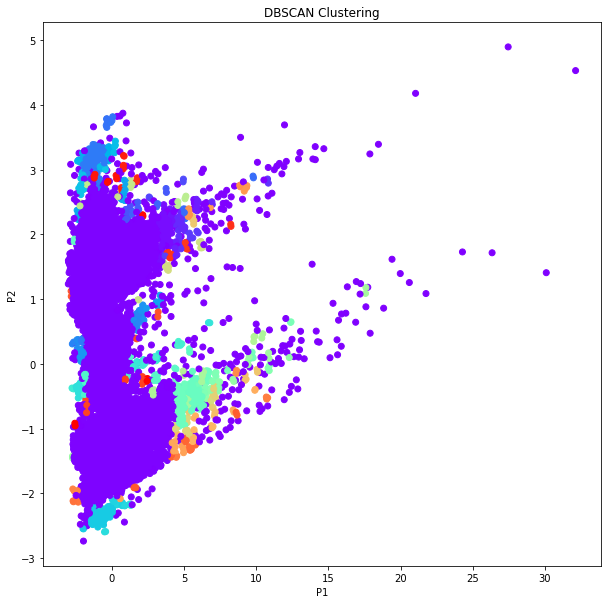

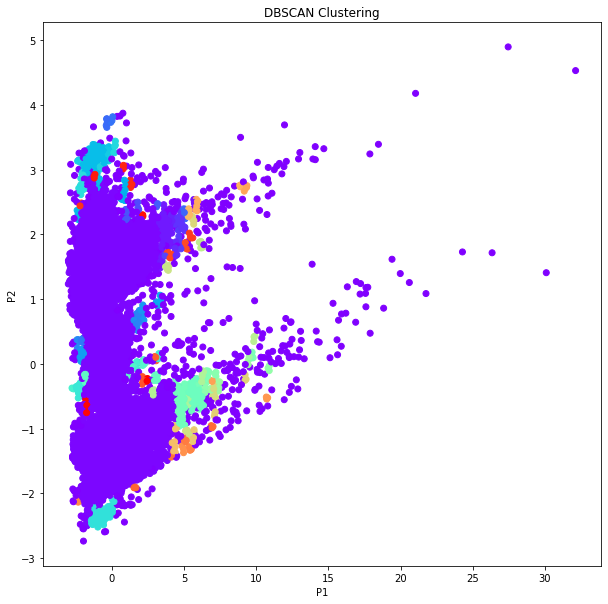

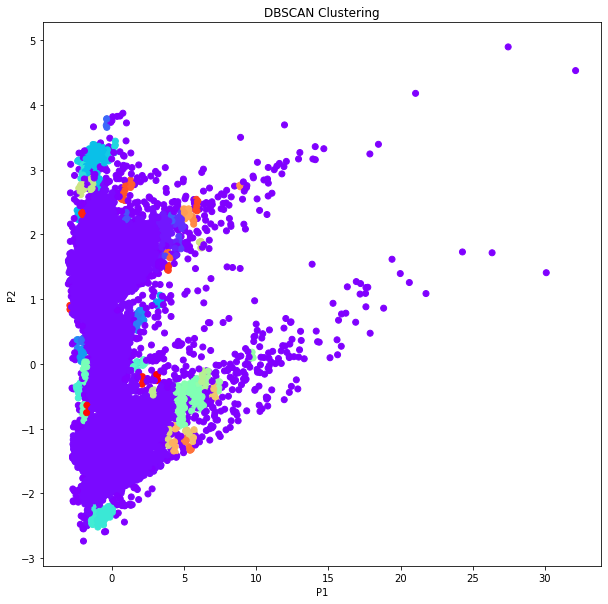

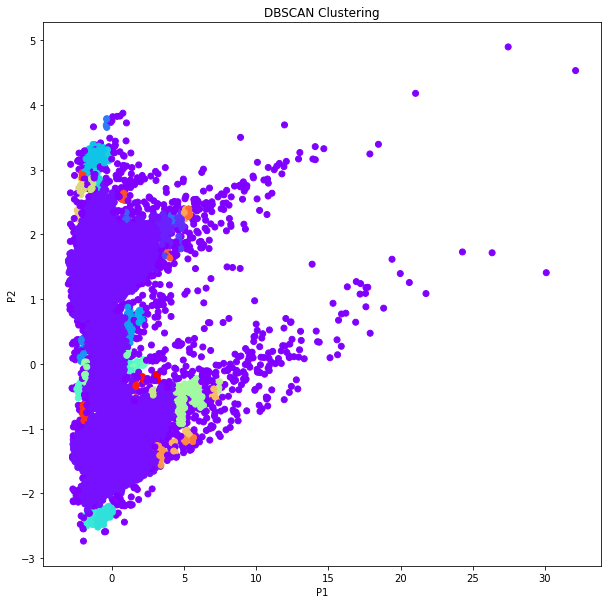

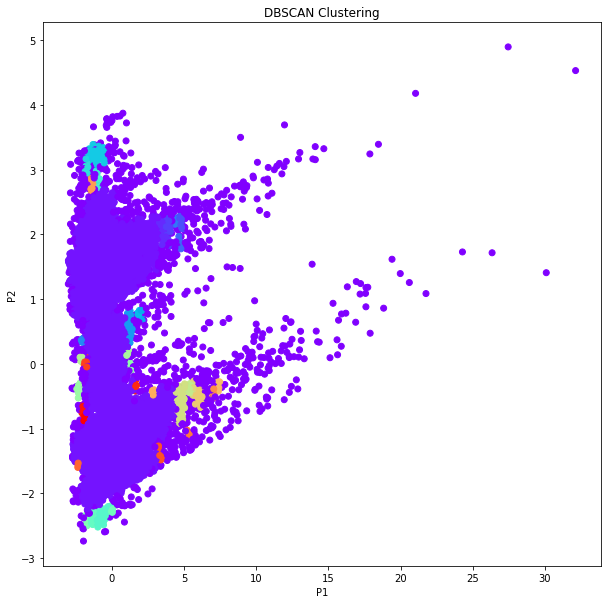

...

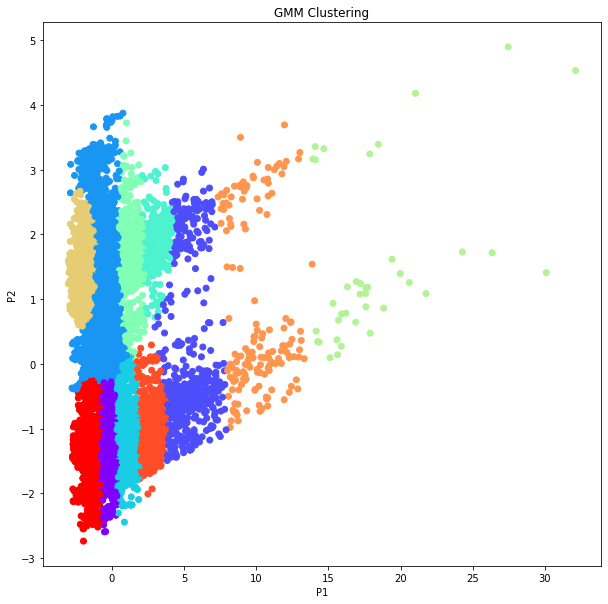

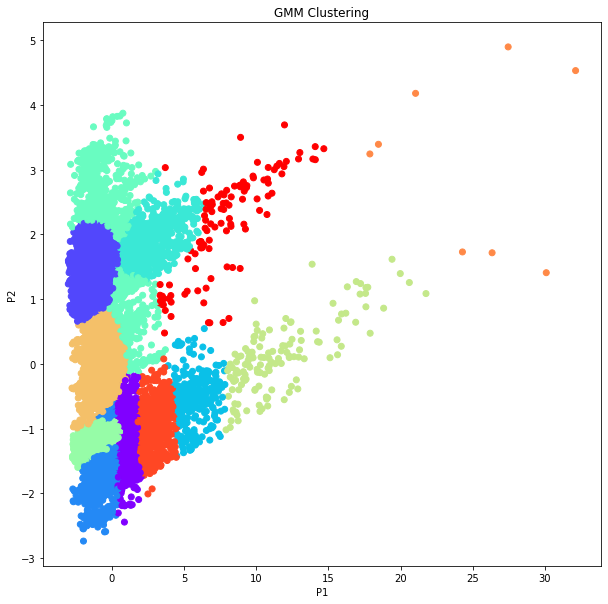

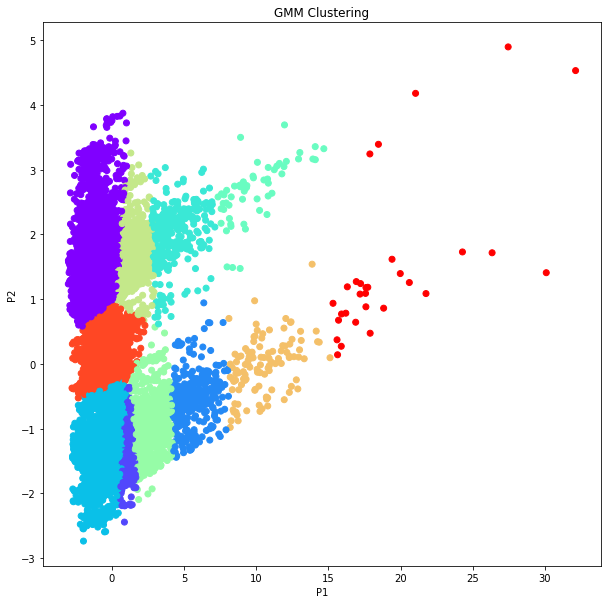

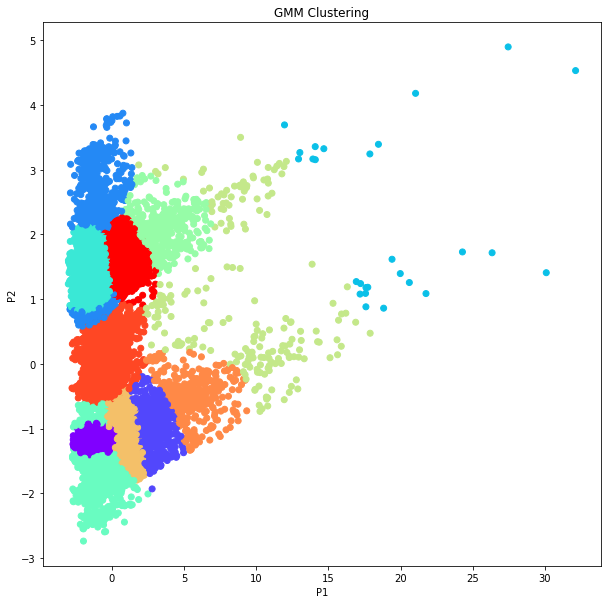

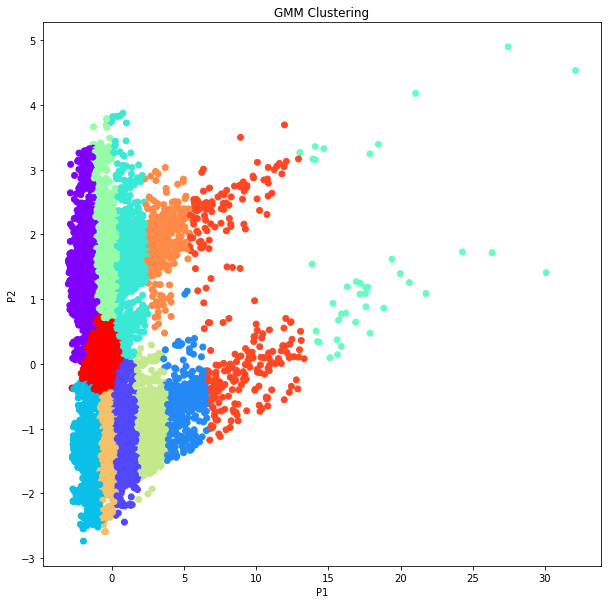

<Figure size 720x720 with 0 Axes>

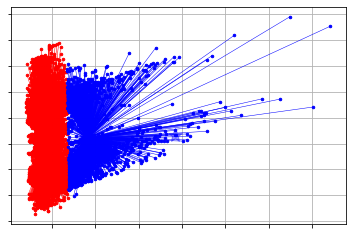

<Figure size 720x720 with 0 Axes>

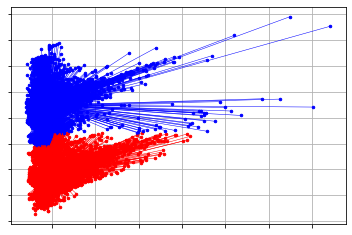

<Figure size 720x720 with 0 Axes>

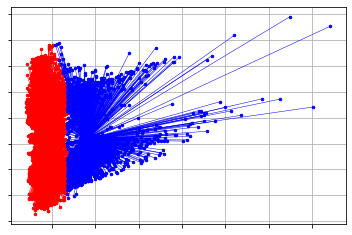

<Figure size 720x720 with 0 Axes>

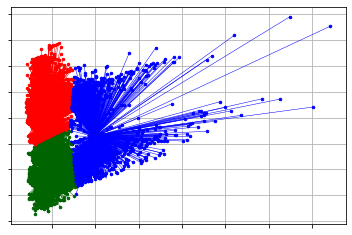

<Figure size 720x720 with 0 Axes>

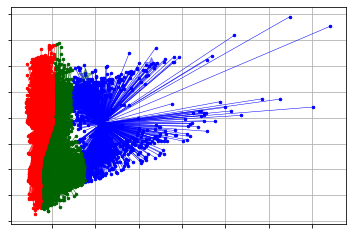

<Figure size 720x720 with 0 Axes>

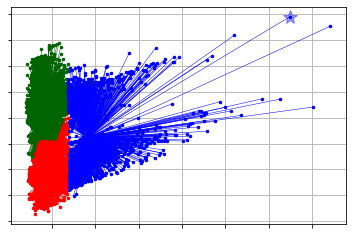

<Figure size 720x720 with 0 Axes>

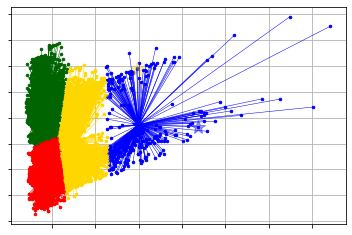

<Figure size 720x720 with 0 Axes>

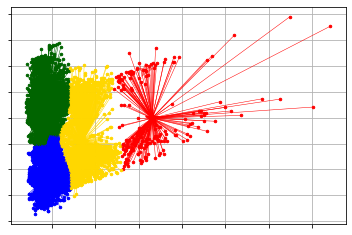

<Figure size 720x720 with 0 Axes>

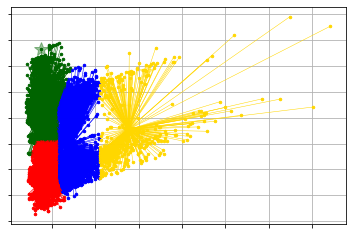

<Figure size 720x720 with 0 Axes>

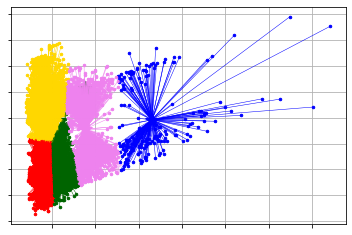

<Figure size 720x720 with 0 Axes>

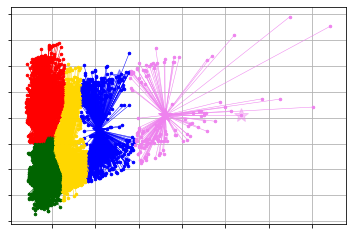

<Figure size 720x720 with 0 Axes>

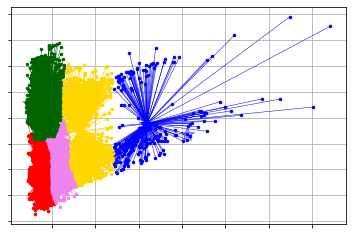

<Figure size 720x720 with 0 Axes>

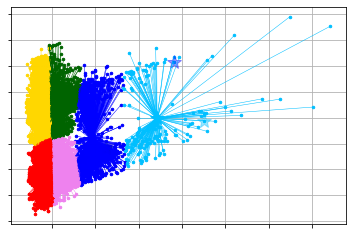

<Figure size 720x720 with 0 Axes>

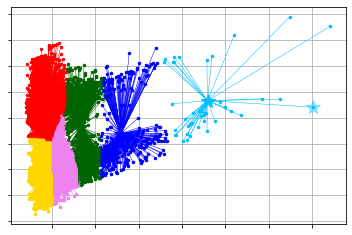

<Figure size 720x720 with 0 Axes>

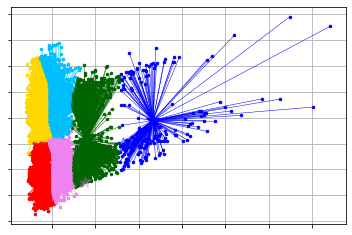

<Figure size 720x720 with 0 Axes>

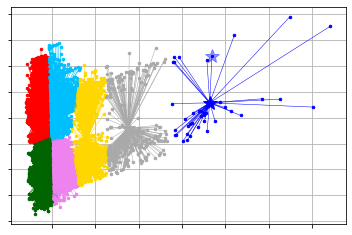

<Figure size 720x720 with 0 Axes>

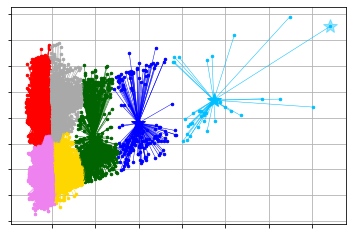

<Figure size 720x720 with 0 Axes>

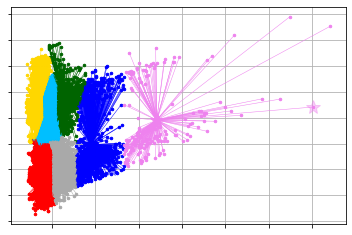

<Figure size 720x720 with 0 Axes>

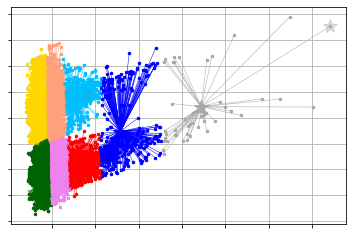

<Figure size 720x720 with 0 Axes>

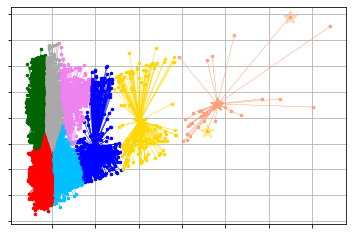

<Figure size 720x720 with 0 Axes>

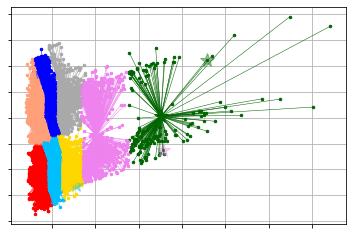

<Figure size 720x720 with 0 Axes>

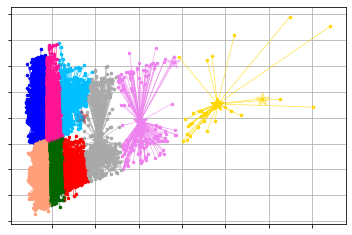

<Figure size 720x720 with 0 Axes>

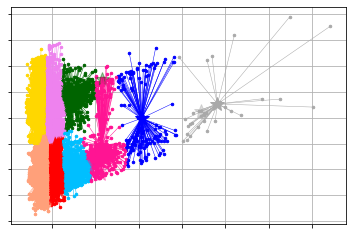

<Figure size 720x720 with 0 Axes>

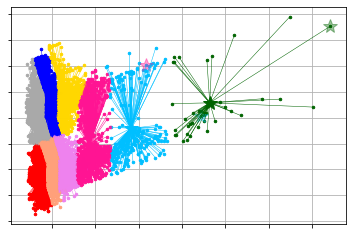

<Figure size 720x720 with 0 Axes>

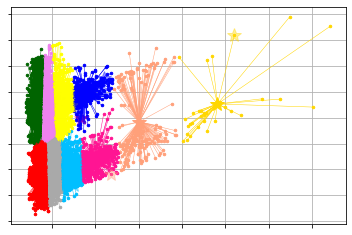

<Figure size 720x720 with 0 Axes>

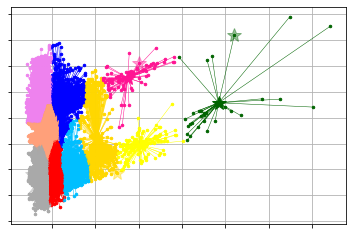

<Figure size 720x720 with 0 Axes>

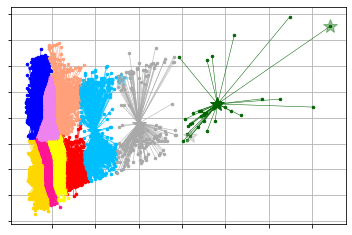

<Figure size 720x720 with 0 Axes>

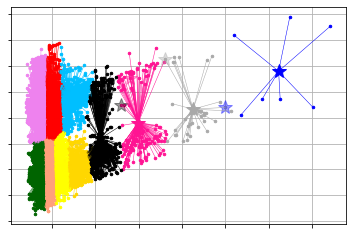

<Figure size 720x720 with 0 Axes>

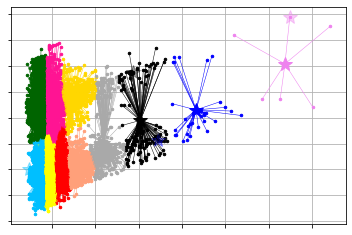

<Figure size 720x720 with 0 Axes>

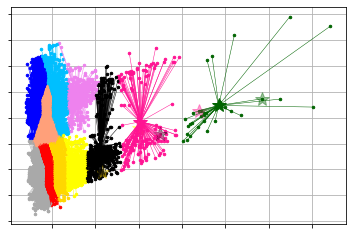

<Figure size 720x720 with 0 Axes>

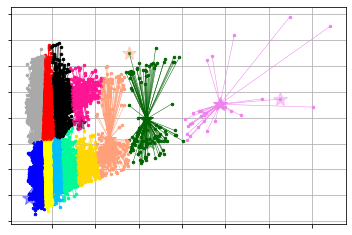

<Figure size 720x720 with 0 Axes>

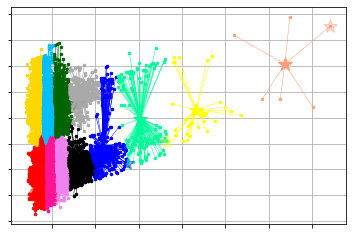

<Figure size 720x720 with 0 Axes>

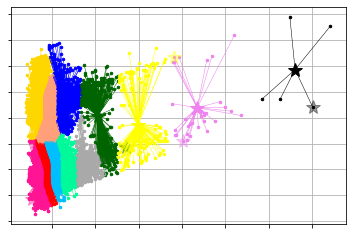

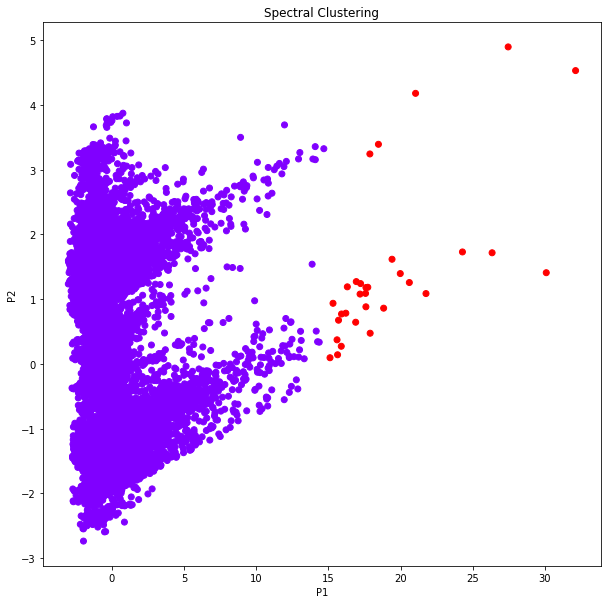

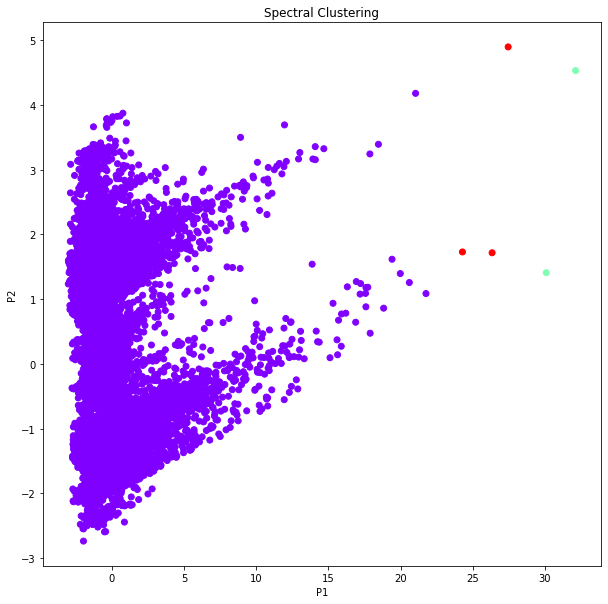

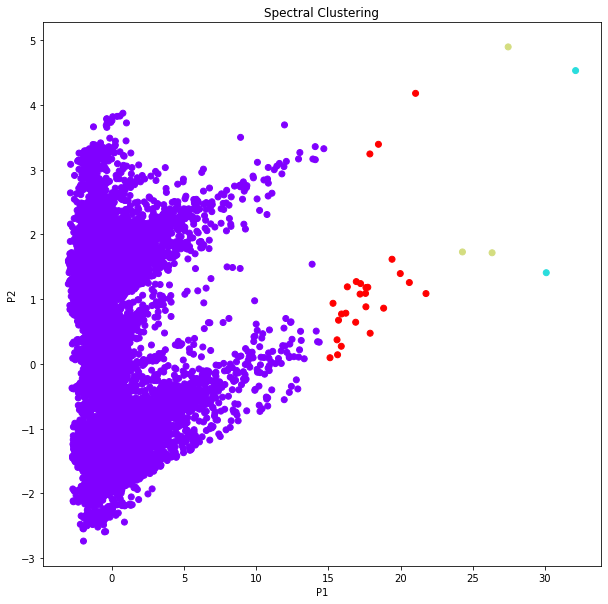

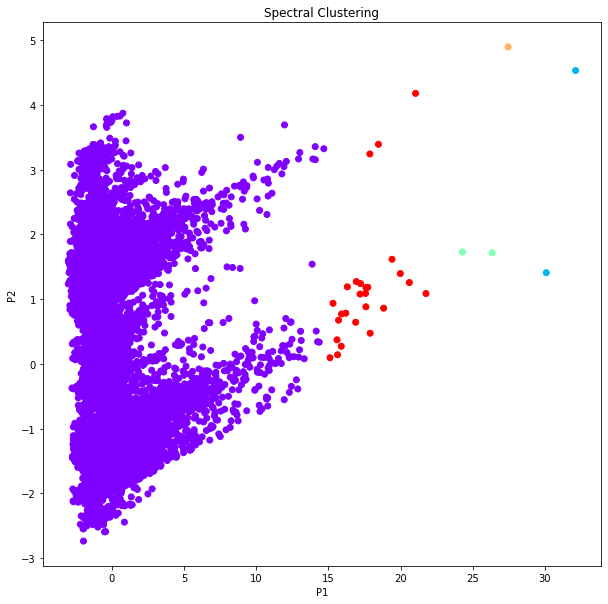

...

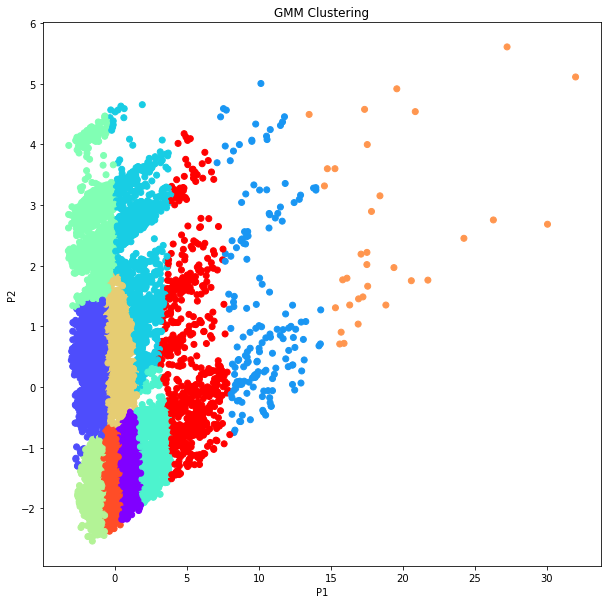

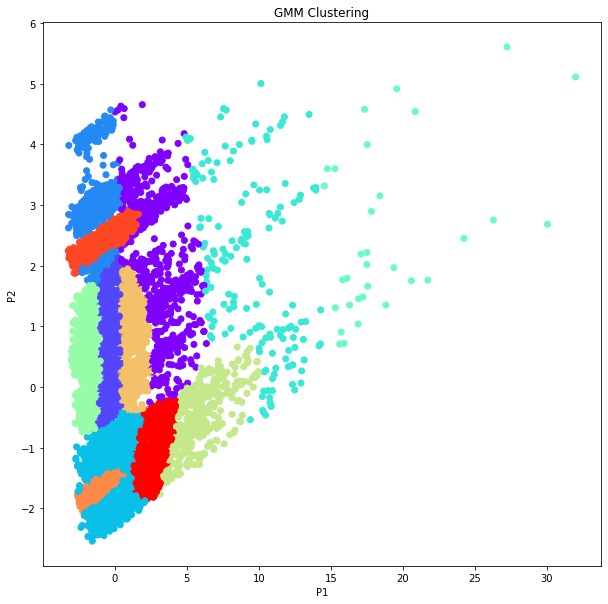

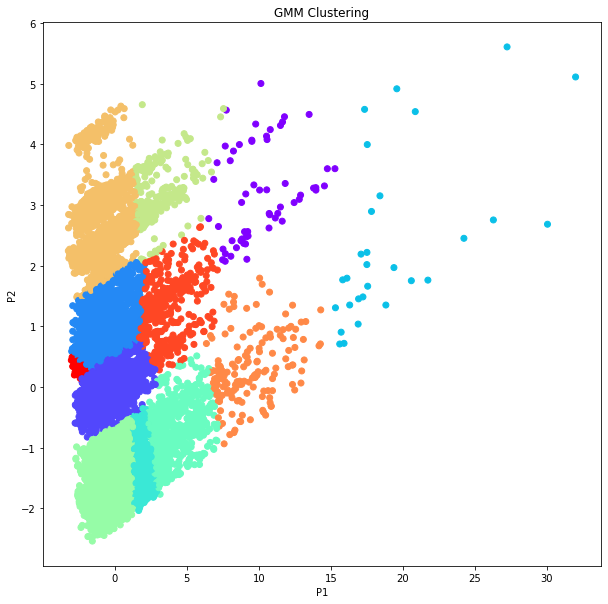

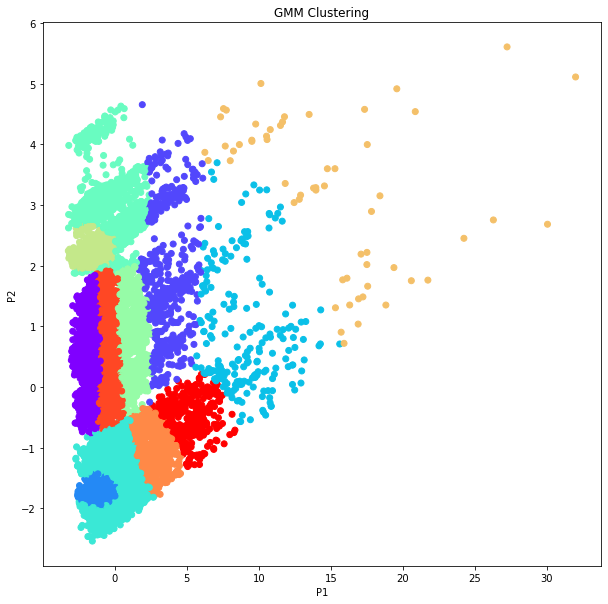

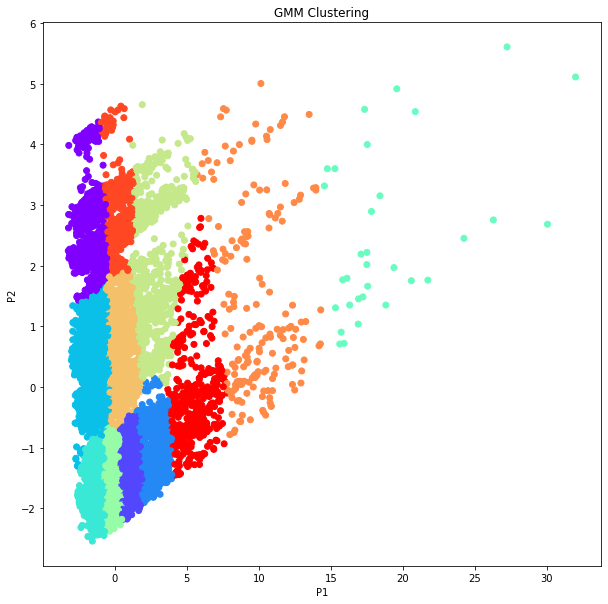

<Figure size 720x720 with 0 Axes>

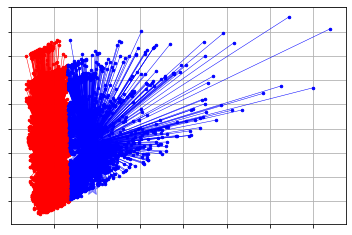

<Figure size 720x720 with 0 Axes>

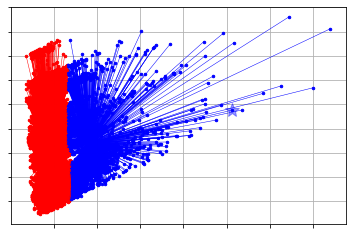

<Figure size 720x720 with 0 Axes>

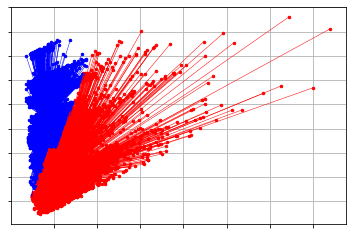

<Figure size 720x720 with 0 Axes>

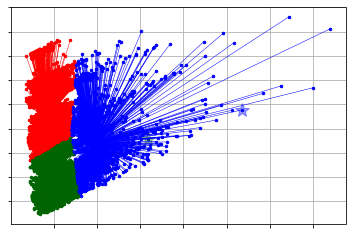

<Figure size 720x720 with 0 Axes>

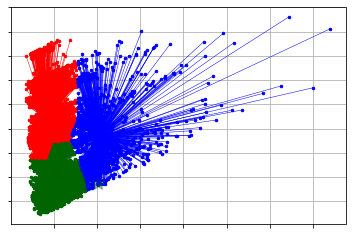

<Figure size 720x720 with 0 Axes>

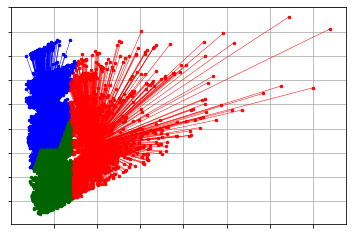

<Figure size 720x720 with 0 Axes>

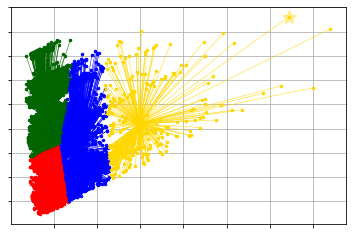

<Figure size 720x720 with 0 Axes>

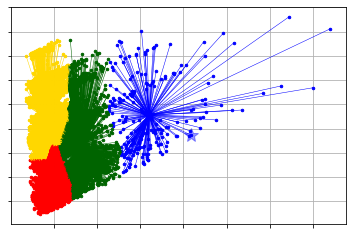

<Figure size 720x720 with 0 Axes>

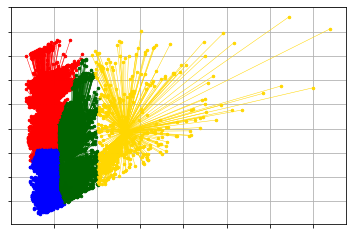

<Figure size 720x720 with 0 Axes>

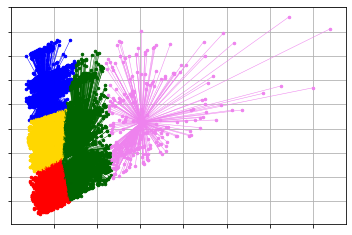

<Figure size 720x720 with 0 Axes>

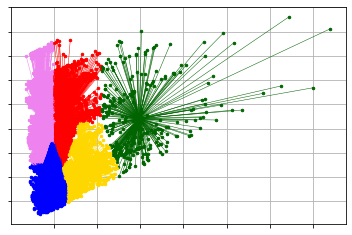

<Figure size 720x720 with 0 Axes>

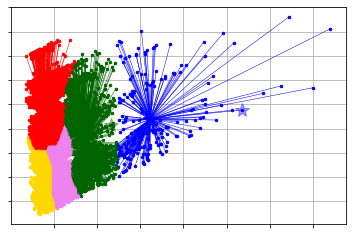

<Figure size 720x720 with 0 Axes>

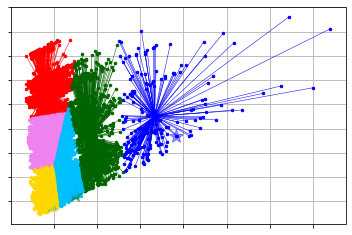

<Figure size 720x720 with 0 Axes>

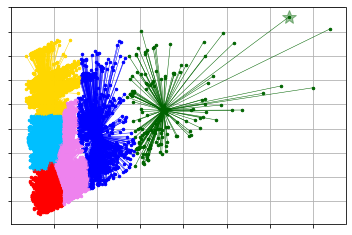

<Figure size 720x720 with 0 Axes>

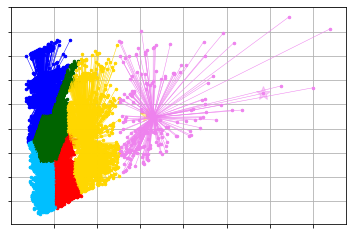

<Figure size 720x720 with 0 Axes>

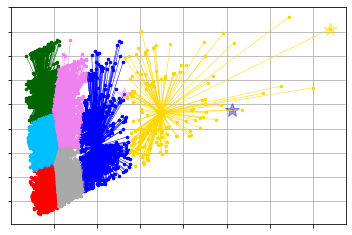

<Figure size 720x720 with 0 Axes>

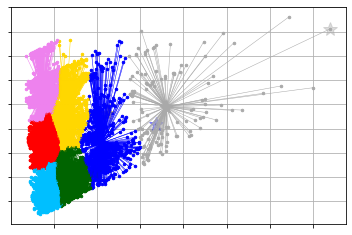

<Figure size 720x720 with 0 Axes>

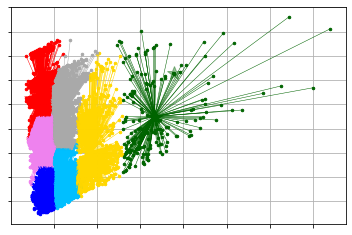

<Figure size 720x720 with 0 Axes>

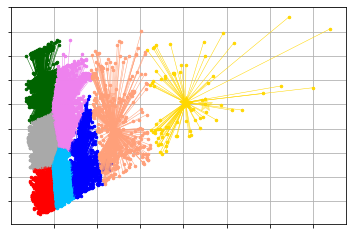

<Figure size 720x720 with 0 Axes>

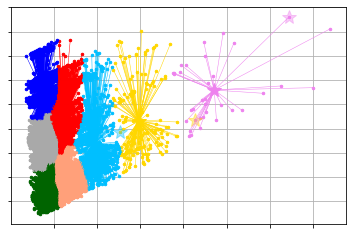

<Figure size 720x720 with 0 Axes>

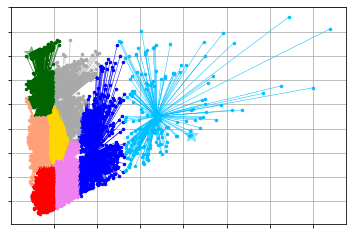

<Figure size 720x720 with 0 Axes>

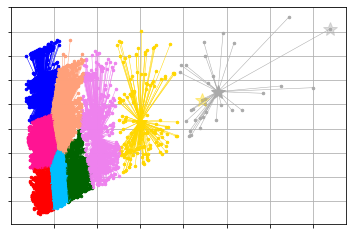

<Figure size 720x720 with 0 Axes>

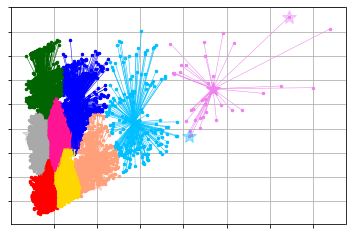

<Figure size 720x720 with 0 Axes>

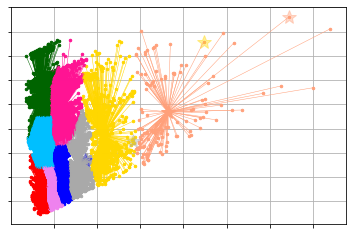

<Figure size 720x720 with 0 Axes>

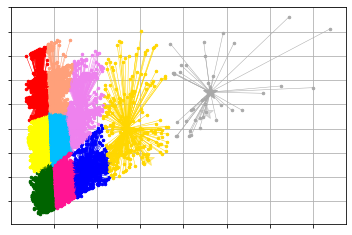

<Figure size 720x720 with 0 Axes>

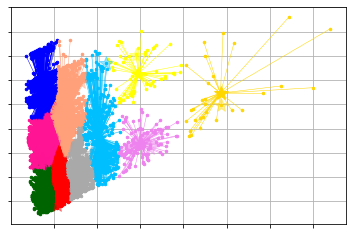

<Figure size 720x720 with 0 Axes>

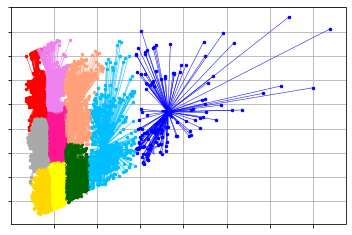

<Figure size 720x720 with 0 Axes>

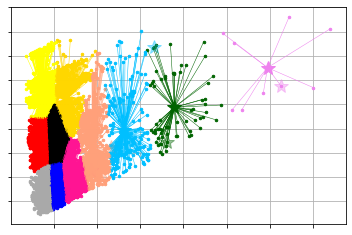

<Figure size 720x720 with 0 Axes>

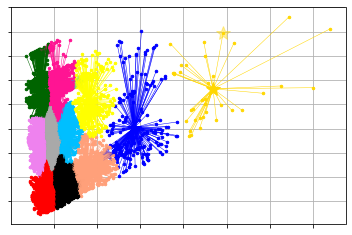

<Figure size 720x720 with 0 Axes>

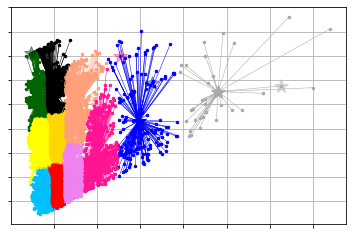

<Figure size 720x720 with 0 Axes>

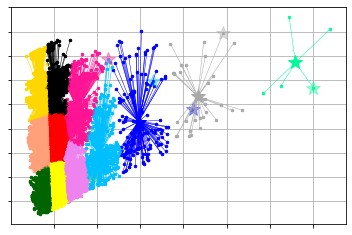

<Figure size 720x720 with 0 Axes>

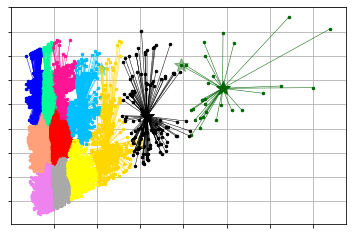

<Figure size 720x720 with 0 Axes>

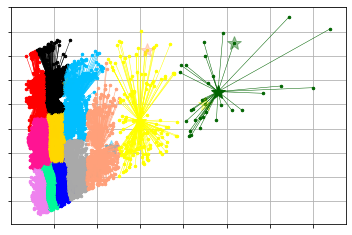

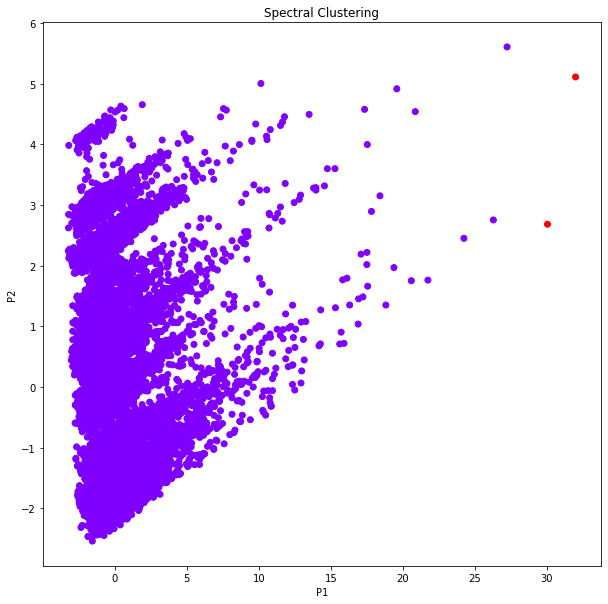

In [ ]:
main()